# Analyze the HNN pixel task

In [1]:
import numpy as np
import torch, sys, io
import matplotlib.pyplot as plt
from IPython import display
from PIL import Image, ImageDraw, ImageSequence, ImageFont
import scipy, scipy.misc, scipy.integrate
solve_ivp = scipy.integrate.solve_ivp

EXPERIMENT_DIR = './experiment-pixels'
sys.path.append(EXPERIMENT_DIR)

from data import get_dataset, make_gym_dataset, sample_gym
from nn_models import MLPAutoencoder, MLP
from hnn import HNN, PixelHNN
from utils import make_gif, L2_loss, integrate_model

## Set some notebook constants

In [2]:
DPI = 120
LINE_SEGMENTS = 20
LINE_WIDTH = 2
FORMAT = 'png'

def get_args():
    return {'input_dim': 2*784,
         'hidden_dim': 200,
         'latent_dim': 2,
         'learn_rate': 1e-3,
         'nonlinearity': 'tanh',
         'total_steps': 2000,
         'print_every': 200,
         'num_frames': 400,
         'name': 'pendulum',
         'seed': 0,
         'save_dir': './{}'.format(EXPERIMENT_DIR),
         'fig_dir': './figures'}

class ObjectView(object):
    def __init__(self, d): self.__dict__ = d

## Make a GIF from frames in the dataset

Successfully loaded data from ././experiment-pixels/pendulum-pixels-dataset.pkl
(400, 28, 28)


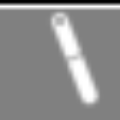

In [3]:
args = ObjectView(get_args())

# load dataset
data = get_dataset(args.name, args.save_dir, verbose=False)
side = data['meta']['side']
trials = data['meta']['trials']
timesteps = data['meta']['timesteps']

frames = data['pixels'][:,:side**2].reshape(-1, side, side)[:args.num_frames]
name = '{}-dataset'.format(args.name)
print(frames.shape)
gifname = make_gif(frames, args.fig_dir, name=name, duration=1e-1, pixels=[120,120])

display.Image(filename=gifname, width=200)

## Construct models

In [10]:
def load_model(args, baseline=False):
    autoencoder = MLPAutoencoder(args.input_dim, args.hidden_dim,
                                     args.latent_dim, nonlinearity='relu')
    model = PixelHNN(args.latent_dim, args.hidden_dim, autoencoder,
                     nonlinearity=args.nonlinearity, baseline=baseline)
    
    case = 'baseline' if baseline else 'hnn'
    path = "{}/pendulum-pixels-{}.tar".format(args.save_dir, case)
    model.load_state_dict(torch.load(path))
    return model

base_model = load_model(args, baseline=True)
hnn_model = load_model(args, baseline=False)

## How good is the autoencoder?

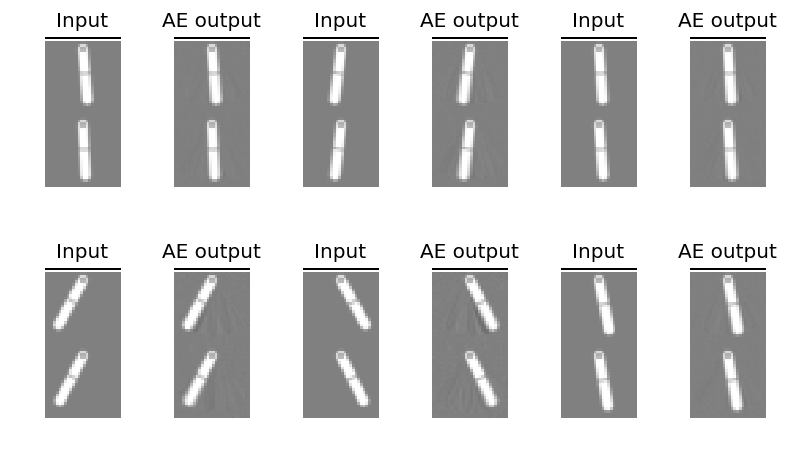

In [11]:
rows, cols = 2, 3
fig = plt.figure(figsize=[1.1*2*cols, 2*rows], dpi=DPI)

x = torch.tensor( data['pixels'], dtype=torch.float32)
x_next = torch.tensor( data['next_pixels'], dtype=torch.float32)

ixs = torch.randperm(trials*timesteps-3*trials)[:2*rows*cols]
bx, bx_next = x[ixs], x_next[ixs]
bx_hat_next = hnn_model.autoencoder(bx_next)

for r in range(rows):
  for c in range(cols):
    ix = r*2*cols + 2*c
    
    plt.subplot(rows, 2*cols, ix + 1)
    im = bx_next[ix].detach().numpy().reshape(-1,side)
    im = (im.clip(-.5,.5) + .5)
    im[0,:] = 0 ; im[1,:] = 1
    plt.imshow(im, cmap='gray') ; plt.axis('off') ; plt.title("Input")
    
    
    plt.subplot(rows, 2*cols, ix + 2)
    im = bx_hat_next[ix].detach().numpy().reshape(-1,side)
    im = (im.clip(-.5,.5) + .5)
    im[0,:] = 0 ; im[1,:] = 1
    plt.imshow(im, cmap='gray') ; plt.axis('off') ; plt.title("AE output")
    
plt.tight_layout() ; plt.show()
fig.savefig('{}/autoencoder-hnn.{}'.format(args.fig_dir, FORMAT))

## How does the latent space look?

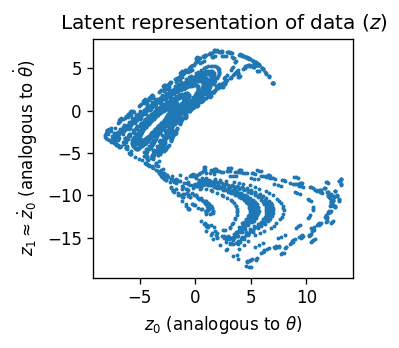

In [12]:
k = 3000
fig = plt.figure(figsize=(3.25, 3), facecolor='white', dpi=DPI)
ax = fig.add_subplot(1, 1, 1, frameon=True)
latents = hnn_model.encode(x).detach().numpy()
plt.plot(latents[:k,0], latents[:k,1], '*', markersize=2)

ax.set_xlabel("$z_0$ (analogous to $\\theta$)")
ax.set_ylabel("$z_1 \\approx \dot z_0$ (analogous to $\dot \\theta$)")
plt.title("Latent representation of data ($z$)")

plt.tight_layout() ; plt.show()
fig.savefig('{}/latents-hnn.{}'.format(args.fig_dir, FORMAT))

## Compare to actual angular quantities

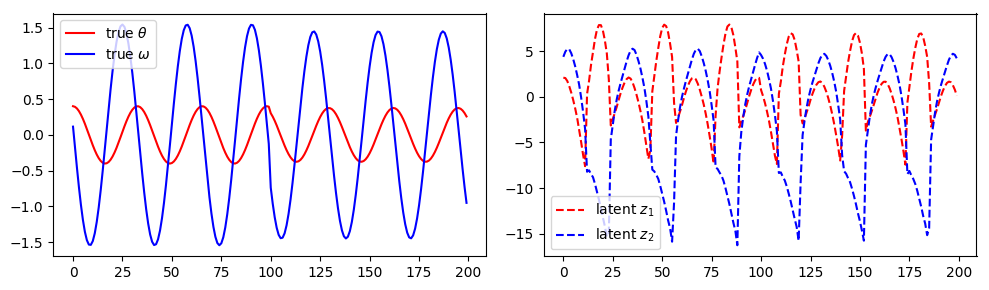

In [13]:
k = 200
fig = plt.figure(figsize=[10,3], dpi=100)
plt.subplot(1,2,1)
plt.plot(data['coords'][:k,0], "r-", label='true $\\theta$')    # ground truth coordinates (theta and omega)
plt.plot(data['coords'][:k,1], "b-", label='true $\omega$')
plt.legend()

plt.subplot(1,2,2)
plt.plot(latents[:k,0], "r--", label='latent $z_1$')   # learned by autoencoder (in an unsupervised manner)
plt.plot(latents[:k,1], "b--", label='latent $z_2$')
plt.legend()

plt.tight_layout() ; plt.show()

## Plot phase space

In [14]:
# set domain
gs = 50
xmin, xmax = latents[:,0].min(), latents[:,0].max()
vmin, vmax = latents[:,1].min(), latents[:,1].max()

# feed through HNN model
gX, gV = np.meshgrid(np.linspace(xmin, xmax, gs), np.linspace(vmin, vmax, gs))
np_mesh_inputs = np.stack([gX.flatten(), gV.flatten()]).T
mesh_inputs = torch.tensor( np_mesh_inputs, requires_grad=True, dtype=torch.float32)

# get scalar fields
F1, F2 = hnn_model.hnn(mesh_inputs)
np_F1, np_F2 = F1.data.numpy().reshape(gs,gs), F2.data.numpy().reshape(gs,gs)

# plot phase space
fig = plt.figure(figsize=(3.15, 3), facecolor='white', dpi=DPI)
ax = fig.add_subplot(1, 1, 1, frameon=True)
plt.contourf(gX, gV, np_F2, cmap='gray_r', levels=20)
ax.set_xlabel("$z_0$ (analogous to $\\theta$)")
ax.set_ylabel("$z_1 \\approx \dot z_0$ (analogous to $\dot \\theta$)")
plt.title("Pendulum phase space")

# plot data points
k = 30 ; t = 100
c = np.linspace(0, 10, k)
plt.scatter(latents[:,0][t:t+k], latents[:,1][t:t+k], c=c, cmap='viridis', label='real data points')

plt.legend(fancybox=True, framealpha=.5, fontsize=7)
plt.tight_layout() ; plt.show()
fig.savefig('{}/learned-phase-space.{}'.format(args.fig_dir, FORMAT))

ValueError: too many values to unpack (expected 2)

## Plot total energy

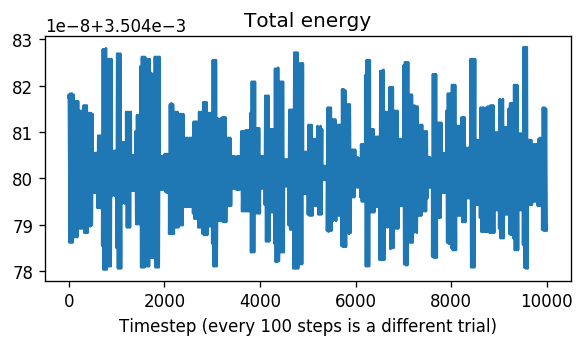

In [25]:
fig = plt.figure(figsize=[5,3], dpi=DPI)

z_values = hnn_model.encode(x)
F1, F2 = hnn_model.hnn(z_values)
energy = F2.detach().numpy()
plt.plot(energy)
plt.title("Total energy")
plt.xlabel("Timestep (every {} steps is a different trial)".format(timesteps))
plt.tight_layout() ; plt.show()
fig.savefig('{}/total-energy.{}'.format(args.fig_dir, FORMAT))

## Integrate HNN in latent space
### Start by getting a real trajectory. Then see how well model matches it

WARN: gym.spaces.Box autodetected dtype as <class 'numpy.float32'>. Please provide explicit dtype.
WARN: gym.spaces.Box autodetected dtype as <class 'numpy.float32'>. Please provide explicit dtype.


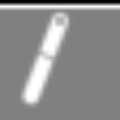

In [10]:
num_frames = 200
test_data = make_gym_dataset(seed=1, timesteps=num_frames+3, trials=1, max_angle=np.pi/8, min_angle=np.pi/9)

# load dataset
side = test_data['meta']['side']

real_pixel_traj = test_data['pixels'][:,:side**2].reshape(-1, side, side)[:num_frames]
name = '{}-truth'.format(args.name)
gifname = make_gif(real_pixel_traj, args.fig_dir, name=name, duration=1e-1, pixels=[120,120])

display.Image(filename=gifname, width=200)

### Integrate models to get a simulated trajectories

In [38]:
# get initial values of latents
x0 = torch.tensor( test_data['pixels'][0:1], dtype=torch.float32)
base_y0 = base_model.encode(x0).detach().numpy().squeeze()
hnn_y0 = hnn_model.encode(x0).detach().numpy().squeeze()

# integrator settings
t_span = [0, 1.015*num_frames]
point_density = num_frames / t_span[-1]
kwargs = {'t_eval': np.linspace(t_span[0], t_span[1], num_frames)}

# integrate models
base_traj = integrate_model(base_model, t_span, base_y0, **kwargs)
hnn_traj = integrate_model(hnn_model, t_span, hnn_y0, **kwargs)

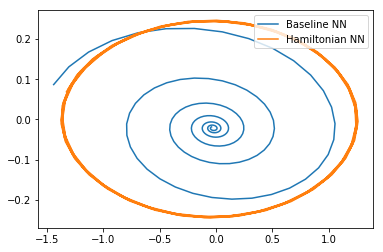

In [39]:
plt.plot(base_traj['y'][0], base_traj['y'][1], label='Baseline NN')
plt.plot(hnn_traj['y'][0], hnn_traj['y'][1], label='Hamiltonian NN')
plt.legend(loc='upper right')
plt.show()

### Decode into latent space and animate

In [40]:
# get initial values of latents
base_zs = torch.tensor( base_traj['y'].T, dtype=torch.float32)
hnn_zs = torch.tensor( hnn_traj['y'].T, dtype=torch.float32)

base_pixel_traj = base_model.decode(base_zs).detach().numpy()[:,:side**2].reshape(-1, side, side)
hnn_pixel_traj = hnn_model.decode(hnn_zs).detach().numpy()[:,:side**2].reshape(-1, side, side)

trajs = np.concatenate([real_pixel_traj, hnn_pixel_traj, base_pixel_traj], axis=-1)

### Add text labels to the GIF

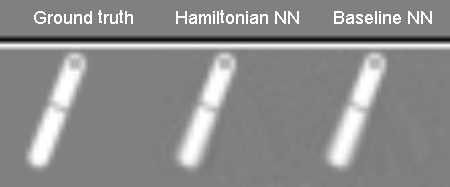

In [41]:
# add whitespace to top
frac = 1/4.
padding = int(frac*side)
zero_tensor = np.zeros_like(trajs)[:,:padding]
trajs = np.concatenate([zero_tensor, trajs], axis=1)

# make and save a GIF
name = '{}-compare'.format(args.name)
pixels = [int((1+frac)*150), 3*150] # dimensions of GIF in pixels
gifname = make_gif(trajs, args.fig_dir, name=name, duration=1e-1, pixels=pixels, divider=padding)

# reload GIF and add text labels to it
im = Image.open(gifname)
frames = []
# Loop over each frame in the animated image
for frame in ImageSequence.Iterator(im):
    # Draw the text on the frame
    d = ImageDraw.Draw(frame)
    font = ImageFont.truetype("/Library/Fonts/Arial.ttf", 18)
    d.text((33,7), "Ground truth", font=font)
    d.text((175,7), "Hamiltonian NN", font=font)
    d.text((333,7), "Baseline NN", font=font)
    del d

    # Saving the image without 'save_all' will turn it into a single frame image, and we can then re-open it
    # To be efficient, we will save it to a stream, rather than to file
    b = io.BytesIO()
    frame.save(b, format="GIF")
    frame = Image.open(b)

    # Then append the single frame image to a list of frames
    frames.append(frame)
# Save the frames as a new image
name = "{}/{}-compare-labeled.gif".format(args.fig_dir, args.name)
frames[0].save(name, save_all=True, append_images=frames[1:])

display.Image(filename=name, width=400)

### We can also add energy via integration of the HNN

In [42]:
def hnn_conserve_energy(t, np_x):
    x = torch.tensor( np_x, requires_grad=True, dtype=torch.float32)
    x = x.view(1, np.size(np_x))
    dx = hnn_model.time_derivative(x).data.numpy().reshape(-1)
    return dx
    
def hnn_add_energy(t, np_x):
    x = torch.tensor( np_x, requires_grad=True, dtype=torch.float32)
    x = x.view(1, np.size(np_x)) # batch size of 1
    _, F2 = hnn_model.hnn(x)
    dx = torch.autograd.grad(F2.sum(), x, create_graph=True)[0]
    np_dx = dx.data.numpy().reshape(-1)
    return np_dx

In [57]:
frames = 500

t_span1, t_span2, t_span3 = [0,50.], [0,1.7], [0,60]
t_tot = t_span1[-1] + t_span2[-1] + t_span3[-1]
point_density = frames/t_tot
t_evals = lambda t_span: int( (t_span[1] - t_span[0])*point_density )

y0 = np.asarray([.4, 0])
kwargs = {'t_eval': np.linspace(t_span1[0], t_span1[1], t_evals(t_span1))}
path1 = integrate_model(hnn_model, t_span1, y0, fun=hnn_conserve_energy, **kwargs)

y0 = path1['y'][:,-1]
kwargs = {'t_eval': np.linspace(t_span2[0], t_span2[1], t_evals(t_span2)), 'rtol': 1e-12}
path2 = integrate_model(hnn_model, t_span2, y0, fun=hnn_add_energy, **kwargs)

y0 = path2['y'][:,-1]
kwargs = {'t_eval': np.linspace(t_span3[0], t_span3[1], t_evals(t_span3))}
path3 = integrate_model(hnn_model, t_span3, y0, fun=hnn_conserve_energy, **kwargs)

y = np.concatenate([path1['y'], path2['y'], path3['y']], axis=-1).T

# y.shape[0] % LINE_SEGMENTS should be 0
terminal_ix = LINE_SEGMENTS * (y.shape[0]//LINE_SEGMENTS)
y = y[:terminal_ix]
print(y.shape)

(480, 2)


### Visualize integration

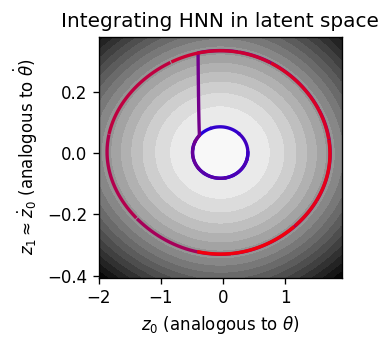

In [58]:
fig = plt.figure(figsize=(3.15, 3), facecolor='white', dpi=DPI)

ax = fig.add_subplot(1, 1, 1, frameon=True)
plt.contourf(gX, gV, np_F2, cmap='gray_r', levels=20)
for i, l in enumerate(np.split(y, LINE_SEGMENTS)):
    
    color = (float(i)/LINE_SEGMENTS, 0, 1-float(i)/LINE_SEGMENTS)
    ax.plot(l[:,0],l[:,1],color=color, linewidth=LINE_WIDTH)

ax.set_xlabel("$x_0$") ; ax.set_ylabel("$x_1$")
ax.set_title("Integrating HNN in latent space")

ax.set_xlabel("$z_0$ (analogous to $\\theta$)")
ax.set_ylabel("$z_1 \\approx \dot z_0$ (analogous to $\dot \\theta$)")

plt.tight_layout() ; plt.show()
fig.savefig('{}/integrate-latent-hnn.{}'.format(args.fig_dir, FORMAT))

### Project back into pixel space and render

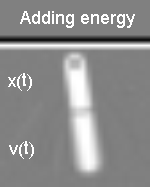

In [59]:
# back to pixel space
y_gif = y[::2]
simulated_latents = torch.tensor( y_gif, dtype=torch.float32)
simulated_pixels = hnn_model.decode(simulated_latents)
addenergy_traj = simulated_pixels.data.numpy()[:,:side**2].reshape(-1,side,side)

# add whitespace to top
frac = 1/4.
padding = int(frac*side)
zero_tensor = np.zeros_like(addenergy_traj)[:,:padding]
addenergy_traj = np.concatenate([zero_tensor, addenergy_traj], axis=1)

# make and save a GIF
name = '{}-addenergy'.format(args.name)
pixels = [int((1+frac)*150), 1*150] # dimensions of GIF in pixels
gifname = make_gif(addenergy_traj, args.fig_dir, name=name, duration=5e-2, pixels=pixels, divider=padding)

# reload GIF and add text labels to it
im = Image.open(gifname)
frames = []
# Loop over each frame in the animated image
for frame in ImageSequence.Iterator(im):
    # Draw the text on the frame
    d = ImageDraw.Draw(frame)
    font = ImageFont.truetype("/Library/Fonts/Arial.ttf", 18)
    d.text((20,7), "Adding energy", font=font)
    d.text((8,70), "x(t)", font=font)
    d.text((8,138), "v(t)", font=font)
    del d

    # Saving the image without 'save_all' will turn it into a single frame image, and we can then re-open it
    # To be efficient, we will save it to a stream, rather than to file
    b = io.BytesIO()
    frame.save(b, format="GIF")
    frame = Image.open(b)

    # Then append the single frame image to a list of frames
    frames.append(frame)
# Save the frames as a new image
name = "{}/{}-addenergy-labeled.gif".format(args.fig_dir, args.name)
frames[0].save(name, save_all=True, append_images=frames[1:])

display.Image(filename=name, width=130)